# Project  - Electronic Product Pricing

## DESCRIPTION

### Problem Statement
* This is a list of over 5000 electronic products with pricing information across 25 unique fields provided by Kaggle.The dataset also includes the brand, category, merchant, name,manufacturer,source, and more.

### Goal
* The aim is to understand how each brand,category,manufacturer price has changed over the years
* Is there a correlation between the data poits of this dataset
* What is the competitive pricing strategy for the same product from different merchants


## Importing All the library

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from statsmodels.formula.api import ols
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.decomposition import PCA
import xgboost as xgb
from IPython.display import Image
from sklearn.model_selection import train_test_split
from IPython.display import Image

C:\Users\Subhasish Das\Anaconda3\lib\site-packages\dask\config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
C:\Users\Subhasish Das\Anaconda3\lib\site-packages\distributed\config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [3]:
pd.set_option('display.max_row', 100000)
pd.set_option('display.max_columns',500000)

# Loading Data Set

In [4]:
dt_electronics=pd.read_csv("electronics_products_pricing.csv")

In [5]:
dt_electronics.head()

,id,prices.availability,prices.condition,prices.currency,prices.dateSeen,prices.isSale,prices.merchant,prices.shipping,prices.sourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price
0,AVphrugr1cnluZ0-FOeH,Yes,New,USD,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",False,Bestbuy.com,NaN,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99
1,AVrI6FDbv8e3D1O-lm4R,Yes,New,USD,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99
2,AVpiLlubilAPnD_xBoTa,Yes,New,USD,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99
3,AVpgQP5vLJeJML43LQbd,Yes,New,USD,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99
4,AV1YDsmoGV-KLJ3adcbe,More on the Way,New,USD,2017-12-05T13:00:00Z,True,bhphotovideo.com,Free Expedited Shipping for most orders over $49,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00


In [6]:
dt_electronics.shape

(5436, 25)

In [7]:
dt_electronics.describe()

,price
count,5436.000000
mean,492.941161
std,769.246463
min,1.000000
25%,79.950000
50%,194.410000
75%,486.952500
max,6999.990000


In [8]:
dt_electronics.isnull().sum()

id                        0
prices.availability       0
prices.condition          0
prices.currency           0
prices.dateSeen           0
prices.isSale             0
prices.merchant           0
prices.shipping        2237
prices.sourceURLs         0
asins                     0
brand                     0
categories                0
dateAdded                 0
dateUpdated               0
ean                    4261
imageURLs                 0
keys                      0
manufacturer           2959
manufacturerNumber        0
name                      0
primaryCategories         0
sourceURLs                0
upc                       0
weight                    0
price                     0
dtype: int64

## Feature-Engineering

In [9]:
dt_electronics.columns

Index(['id', 'prices.availability', 'prices.condition', 'prices.currency',
       'prices.dateSeen', 'prices.isSale', 'prices.merchant',
       'prices.shipping', 'prices.sourceURLs', 'asins', 'brand', 'categories',
       'dateAdded', 'dateUpdated', 'ean', 'imageURLs', 'keys', 'manufacturer',
       'manufacturerNumber', 'name', 'primaryCategories', 'sourceURLs', 'upc',
       'weight', 'price'],
      dtype='object')

> There are some columns with . I am replacing those names

In [10]:
dt_electronics.rename(columns={'prices.availability':'pricesavailability','prices.condition':'pricescondition','prices.currency':'pricescurrency','prices.dateSeen':'pricesdateSeen','prices.isSale':'pricesisSale','prices.merchant':'pricesmerchant','prices.shipping':'pricesshipping','prices.sourceURLs':'pricessourceURLs'},inplace=True)

In [11]:
dt_electronics.head()

,id,pricesavailability,pricescondition,pricescurrency,pricesdateSeen,pricesisSale,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price
0,AVphrugr1cnluZ0-FOeH,Yes,New,USD,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",False,Bestbuy.com,NaN,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99
1,AVrI6FDbv8e3D1O-lm4R,Yes,New,USD,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99
2,AVpiLlubilAPnD_xBoTa,Yes,New,USD,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99
3,AVpgQP5vLJeJML43LQbd,Yes,New,USD,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99
4,AV1YDsmoGV-KLJ3adcbe,More on the Way,New,USD,2017-12-05T13:00:00Z,True,bhphotovideo.com,Free Expedited Shipping for most orders over $49,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00


> I will drop the Id column

In [12]:
dt_electronics.drop('id',axis=1,inplace=True)

> Finding different unique values for each columns

In [13]:
for feature in dt_electronics.columns[:]:
    print(feature,":",len(dt_electronics[feature].unique()),'labels')

pricesavailability : 13 labels
pricescondition : 11 labels
pricescurrency : 2 labels
pricesdateSeen : 3066 labels
pricesisSale : 2 labels
pricesmerchant : 587 labels
pricesshipping : 60 labels
pricessourceURLs : 3562 labels
asins : 819 labels
brand : 254 labels
categories : 792 labels
dateAdded : 784 labels
dateUpdated : 727 labels
ean : 118 labels
imageURLs : 819 labels
keys : 819 labels
manufacturer : 198 labels
manufacturerNumber : 819 labels
name : 813 labels
primaryCategories : 5 labels
sourceURLs : 819 labels
upc : 385 labels
weight : 578 labels
price : 2059 labels


> Finding the value of each datatypes of this dataset

In [14]:
dt_electronics.dtypes

pricesavailability     object
pricescondition        object
pricescurrency         object
pricesdateSeen         object
pricesisSale             bool
pricesmerchant         object
pricesshipping         object
pricessourceURLs       object
asins                  object
brand                  object
categories             object
dateAdded              object
dateUpdated            object
ean                    object
imageURLs              object
keys                   object
manufacturer           object
manufacturerNumber     object
name                   object
primaryCategories      object
sourceURLs             object
upc                    object
weight                 object
price                 float64
dtype: object

> As all the columns are objects we have to convert them so that we can apply any kind of algorithm 

> working with pricesavailability column

In [15]:
dt_electronics.pricesavailability.value_counts()

In Stock           2395
Yes                1590
yes                 657
TRUE                513
Out Of Stock         89
Special Order        80
More on the Way      63
undefined            28
sold                 14
No                    4
Retired               1
FALSE                 1
7 available           1
Name: pricesavailability, dtype: int64

In [16]:
dt_electronics.pricesavailability.unique()

array(['Yes', 'More on the Way', 'In Stock', 'yes', 'TRUE',
       'Special Order', 'Out Of Stock', 'undefined', 'No', 'sold',
       '7 available', 'FALSE', 'Retired'], dtype=object)

> I will calculate the the count of each unique values of pricesavailability and replace the value with the count 

In [17]:
pricesavailability_map=dt_electronics['pricesavailability'].value_counts().to_dict()

In [18]:
pricesavailability_map

{'In Stock': 2395,
 'Yes': 1590,
 'yes': 657,
 'TRUE': 513,
 'Out Of Stock': 89,
 'Special Order': 80,
 'More on the Way': 63,
 'undefined': 28,
 'sold': 14,
 'No': 4,
 'Retired': 1,
 'FALSE': 1,
 '7 available': 1}

> here I will replace 'In Stock' with 2395

In [19]:
dt_electronics['pricesavailability']=dt_electronics['pricesavailability'].map(pricesavailability_map)
dt_electronics.head()

,pricesavailability,pricescondition,pricescurrency,pricesdateSeen,pricesisSale,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price
0,1590,New,USD,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",False,Bestbuy.com,NaN,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99
1,1590,New,USD,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99
2,1590,New,USD,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99
3,1590,New,USD,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99
4,63,New,USD,2017-12-05T13:00:00Z,True,bhphotovideo.com,Free Expedited Shipping for most orders over $49,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00


> Now I will apply the same process for pricescondition

In [20]:
dt_electronics.pricescondition.unique()

array(['New', 'new', 'Refurbished', 'Manufacturer refurbished',
       'Seller refurbished', 'Used', 'New other (see details)',
       'pre-owned',
       '5/16" Ring Terminal, 3 ft. 8 GA Black Ground Cable, 6 ft. Split Loom Tubing, Depth: 6.5" (165mm) (top) 11.2" (285mm) (bottom), Item Weight: 18.5 lbs., Frequency Response 25Hz - 500Hz, Line Output, Max Power: 1100 Watt x 1 Channel @ 2 Ohm, 30 ft. Speaker Wire, Boss Illuminated Logo, Height: 12.8" (325mm), (3) Rubber Grommets, Item Weight: 2 lbs., Size 10", 20 ft. 8 GA Red Power Cable, Ported enclosure for greater output and deeper bass, 2 Ohm Stable, Class A/B, Voice Coil Size 2", Black rubber surround, Nominal Impedance 4 ohm, Rugged fiberboard construction with thick carpet covering, Warranty: 1 Year Manufacturer Warranty, MOSFET Power, Weight: 6 lbs, Width: 17.7" (450mm), Condition: Brand New!, Low Pass Crossover, List item, RMS Power: 250 Watt x 1 Channel @ 4 Ohm, Remote Bass Control Included!, 1/4" Ring Terminal, 16 ft. 18 GA Bl

In [21]:
dt_electronics.pricescondition.value_counts()

New                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [22]:
pricescondition_map=dt_electronics['pricescondition'].value_counts().to_dict()
pricescondition_map

{'New': 4645,
 'new': 537,
 'Used': 118,
 'New other (see details)': 63,
 'Manufacturer refurbished': 43,
 'Seller refurbished': 15,
 'Refurbished': 8,
 'pre-owned': 3,
 'refurbished': 2,
 '5/16" Ring Terminal, 3 ft. 8 GA Black Ground Cable, 6 ft. Split Loom Tubing, Depth: 6.5" (165mm) (top) 11.2" (285mm) (bottom), Item Weight: 18.5 lbs., Frequency Response 25Hz - 500Hz, Line Output, Max Power: 1100 Watt x 1 Channel @ 2 Ohm, 30 ft. Speaker Wire, Boss Illuminated Logo, Height: 12.8" (325mm), (3) Rubber Grommets, Item Weight: 2 lbs., Size 10", 20 ft. 8 GA Red Power Cable, Ported enclosure for greater output and deeper bass, 2 Ohm Stable, Class A/B, Voice Coil Size 2", Black rubber surround, Nominal Impedance 4 ohm, Rugged fiberboard construction with thick carpet covering, Warranty: 1 Year Manufacturer Warranty, MOSFET Power, Weight: 6 lbs, Width: 17.7" (450mm), Condition: Brand New!, Low Pass Crossover, List item, RMS Power: 250 Watt x 1 Channel @ 4 Ohm, Remote Bass Control Included!, 1

In [23]:
dt_electronics['pricescondition']=dt_electronics['pricescondition'].map(pricescondition_map)
dt_electronics.head()

,pricesavailability,pricescondition,pricescurrency,pricesdateSeen,pricesisSale,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price
0,1590,4645,USD,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",False,Bestbuy.com,NaN,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99
1,1590,4645,USD,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99
2,1590,4645,USD,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99
3,1590,4645,USD,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",False,Bestbuy.com,NaN,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99
4,63,4645,USD,2017-12-05T13:00:00Z,True,bhphotovideo.com,Free Expedited Shipping for most orders over $49,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00


> For pricescurrency and pricesisSale I will apply one-hot encodding

In [24]:
dt_electronics.pricescurrency.unique()

array(['USD', 'CAD'], dtype=object)

In [25]:
dt_electronics.pricesisSale.unique()

array([False,  True])

In [26]:
Currency=pd.get_dummies(dt_electronics.pricescurrency,drop_first=True,prefix='Currency')

In [27]:
dt_electronics=pd.concat([dt_electronics,Currency],axis=1)

In [28]:
dt_electronics.drop('pricescurrency',axis=1,inplace=True)

In [29]:
pricesisSale=pd.get_dummies(dt_electronics.pricesisSale,drop_first=True,prefix='pricesisSale')
dt_electronics=pd.concat([dt_electronics,pricesisSale],axis=1)
dt_electronics.drop('pricesisSale',axis=1,inplace=True)
dt_electronics.head()


,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",Bestbuy.com,NaN,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",Bestbuy.com,NaN,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",Bestbuy.com,NaN,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",Bestbuy.com,NaN,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0
4,63,4645,2017-12-05T13:00:00Z,bhphotovideo.com,Free Expedited Shipping for most orders over $49,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1


> I will calculate the the count of each unique values of pricesmerchant and replace the value with the count 

In [30]:
dt_electronics.pricesmerchant.unique()

array(['Bestbuy.com', 'bhphotovideo.com', 'Video & Audio Center',
       'Creative Audio', 'mnmdiscount1', 'CompuDirect',
       'World Wide Stereo', 'tri-state-camera',
       'Coldriver20 Electronics Inc', 'wholesale_connection',
       'AMI Ventures Inc', 'PhotoSavings', 'EZ Tech',
       'West Coast Limited', 'Walmart.com', 'OJCommerce', 'Beach Camera',
       'Wholesale Connection', 'n.n3288', 'gabrians', 'ElectroCell',
       'legendmicro-wholesale', 'Walts TV', 'Car Audio Closeout',
       'eLGeo Electronics', 'Electronic Express', 'brandsmartusa',
       'ewholesale2011', 'evergreenpoint', 'onlycellphone',
       'hypermicrosystems', 'musicalsupplydirect', 'ericy23', 'buydig',
       'videoandaudiocenter', 'gear4less', 'DealClock', 'wwstereo',
       'Focus Camera', 'dealonline18', 'cable-n-chargers',
       'electronicsliquidators', 'tfldealz', 'SaveCentral, LLC',
       'Clover Hill', 'waltstv', 'electricdiamond',
       'Alex Magic Electronics', 'Sound of Tri-State', 'aapltr

In [31]:
dt_electronics.pricesmerchant.value_counts()

Bestbuy.com                             2109
bhphotovideo.com                        1119
Walmart.com                              512
Beach Camera                             153
AMI Ventures Inc                          46
Focus Camera                              39
buydig                                    36
gear4less                                 33
echo-and-optics                           32
Beach Audio Inc                           29
Best Buy                                  26
UnbeatableSale                            26
World Wide Stereo                         24
BuyVPC                                    21
Car Audio Closeout                        21
Electronics Expo (Authorized Dealer)      20
DealClock                                 19
Video & Audio Center                      17
electronic_express                        16
Electronic Express                        13
antonline.com                             12
OneCall                                   12
The Pixel 

In [32]:
pricesmerchant_map=dt_electronics['pricesmerchant'].value_counts().to_dict()
pricesmerchant_map

{'Bestbuy.com': 2109,
 'bhphotovideo.com': 1119,
 'Walmart.com': 512,
 'Beach Camera': 153,
 'AMI Ventures Inc': 46,
 'Focus Camera': 39,
 'buydig': 36,
 'gear4less': 33,
 'echo-and-optics': 32,
 'Beach Audio Inc': 29,
 'Best Buy': 26,
 'UnbeatableSale': 26,
 'World Wide Stereo': 24,
 'BuyVPC': 21,
 'Car Audio Closeout': 21,
 'Electronics Expo (Authorized Dealer)': 20,
 'DealClock': 19,
 'Video & Audio Center': 17,
 'electronic_express': 16,
 'Electronic Express': 13,
 'antonline.com': 12,
 'OneCall': 12,
 'The Pixel Hub': 11,
 'OutletPC': 11,
 'Dell.com': 10,
 'Newegg': 10,
 'outletmp3': 10,
 'Technology Galaxy': 9,
 'Growkart': 9,
 'Wholesale Connection': 9,
 'Creative Audio': 9,
 'Sound of Tri-State': 9,
 'DemProductSales': 9,
 'Clover Hill': 9,
 'brandsmartusa': 9,
 'wwstereo': 9,
 'eLGeo Electronics': 8,
 'HPP Enterprises': 8,
 'My Goods': 8,
 'gadget-town': 8,
 'Hyper Microsystems, Inc.': 8,
 'best_buy': 7,
 'Tech For Less Inc': 7,
 'Sam Ash Music Direct': 7,
 'onecall': 7,
 'ext

> here I will replace 'Bestbuy.com' with 2109

In [33]:
dt_electronics['pricesmerchant']=dt_electronics['pricesmerchant'].map(pricesmerchant_map)
dt_electronics.head()

,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",2109,NaN,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",2109,NaN,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",2109,NaN,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",2109,NaN,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0
4,63,4645,2017-12-05T13:00:00Z,1119,Free Expedited Shipping for most orders over $49,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1


> This column indicate shipping charges of each delivery <br/>


In [34]:
dt_electronics.pricesshipping.unique()

array([nan, 'Free Expedited Shipping for most orders over $49', 'Freight',
       'Standard', 'FREE', 'Value', 'Expedited',
       'Free Shipping on orders 35 and up', 'Free Expedited Shipping',
       'USD 3.99', 'USD 13.32', 'Free Delivery',
       'Free Shippingon orders 35 and up', 'Shipping Charges Apply',
       'USD 3.39', 'USD 16.00', 'USD 12.78', 'USD 13.60', 'USD 11.30',
       'Free Shipping', 'USD 6.65', 'USD 15.42', 'CAD 18.61', 'USD 4.88',
       'Free Standard Shipping', 'USD 10.00', 'USD 13.61', 'USD 25.00',
       'USD 150.00', 'Free Standard Shipping on Orders Over $49',
       'USD 196.92', 'USD 10.10', 'USD 7.81', 'USD 24.04', 'USD 22.64',
       'USD 75.00', 'USD 16.45', 'USD 179.35', 'USD 27.94', 'USD 15.68',
       'USD 37.65', 'USD 18.60', 'USD 13.95', 'USD 79.42',
       'Free Shipping for this Item', 'USD 5.00', 'USD 140.00',
       'USD 7.25', 'USD 14.00', 'USD 35.03', 'USD 0.99', 'USD 25.76',
       'USD 6.00', 'Free Next Day Delivery (USA)', 'USD 2.99',
   

> I will replace those values which indicate free delivery with 0

In [35]:
dt_electronics['pricesshipping']=dt_electronics['pricesshipping'].replace(['Free Expedited Shipping for most orders over $49','Free Shipping on orders 35 and up','Free Expedited Shipping','Free Delivery','Free Shippingon orders 35 and up','Free Shipping','Free Standard Shipping','Free Standard Shipping on Orders Over $49','Free Shipping for this Item','Free Next Day Delivery (USA)','FREE'],0)

In [36]:
dt_electronics.pricesshipping.unique()

array([nan, 0, 'Freight', 'Standard', 'Value', 'Expedited', 'USD 3.99',
       'USD 13.32', 'Shipping Charges Apply', 'USD 3.39', 'USD 16.00',
       'USD 12.78', 'USD 13.60', 'USD 11.30', 'USD 6.65', 'USD 15.42',
       'CAD 18.61', 'USD 4.88', 'USD 10.00', 'USD 13.61', 'USD 25.00',
       'USD 150.00', 'USD 196.92', 'USD 10.10', 'USD 7.81', 'USD 24.04',
       'USD 22.64', 'USD 75.00', 'USD 16.45', 'USD 179.35', 'USD 27.94',
       'USD 15.68', 'USD 37.65', 'USD 18.60', 'USD 13.95', 'USD 79.42',
       'USD 5.00', 'USD 140.00', 'USD 7.25', 'USD 14.00', 'USD 35.03',
       'USD 0.99', 'USD 25.76', 'USD 6.00', 'USD 2.99', 'USD 20.00',
       'USD 22.13', 'USD 60.00', 'USD 2.85', 'USD 5.99'], dtype=object)

> Now I will remove the USD string from each value  

In [37]:
dt_electronics['pricesshipping']=dt_electronics['pricesshipping'].replace(['USD 3.99', 'USD 13.32', 'USD 3.39', 'USD 16.00',
       'USD 12.78', 'USD 13.60', 'USD 11.30', 'USD 6.65', 'USD 15.42',
       'CAD 18.61', 'USD 4.88', 'USD 10.00', 'USD 13.61', 'USD 25.00',
       'USD 150.00', 'USD 196.92', 'USD 10.10', 'USD 7.81', 'USD 24.04',
       'USD 22.64', 'USD 75.00', 'USD 16.45', 'USD 179.35', 'USD 27.94',
       'USD 15.68', 'USD 37.65', 'USD 18.60', 'USD 13.95', 'USD 79.42',
       'USD 5.00', 'USD 140.00', 'USD 7.25', 'USD 14.00', 'USD 35.03',
       'USD 0.99', 'USD 25.76', 'USD 6.00', 'USD 2.99', 'USD 20.00',
       'USD 22.13', 'USD 60.00', 'USD 2.85', 'USD 5.99'],[3.99,13.32,3.39,16.00,12.78,13.60,11.30,6.65,15.42,18.61,4.88,10.00,13.61,25.00,150.00,196.92,10.10,7.81,24.04,22.64,75.00,16.45,179.35,27.94,15.68,37.65,18.60,13.95,79.42,5.00,140.00,7.25,14.00,35.03,0.99,25.76,6.00,2.99,20.00,22.13,60.00,2.85,5.99])

> I will replace all other value with the mean <br/>
> To do that i will replace all the unique string type values with NaN

In [38]:
dt_electronics['pricesshipping']=dt_electronics['pricesshipping'].replace(['Freight','Standard','Value','Expedited','Shipping Charges Apply'],np.nan)

In [39]:
dt_electronics.pricesshipping.unique()

array([   nan,   0.  ,   3.99,  13.32,   3.39,  16.  ,  12.78,  13.6 ,
        11.3 ,   6.65,  15.42,  18.61,   4.88,  10.  ,  13.61,  25.  ,
       150.  , 196.92,  10.1 ,   7.81,  24.04,  22.64,  75.  ,  16.45,
       179.35,  27.94,  15.68,  37.65,  18.6 ,  13.95,  79.42,   5.  ,
       140.  ,   7.25,  14.  ,  35.03,   0.99,  25.76,   6.  ,   2.99,
        20.  ,  22.13,  60.  ,   2.85,   5.99])

> Now I will find the mean and replace the nan values

In [40]:
mean=dt_electronics.pricesshipping.mean()
mean=round(mean)

In [41]:
dt_electronics[['pricesshipping']]=dt_electronics[['pricesshipping']].fillna(mean,axis=1)

In [42]:
dt_electronics['pricesshipping']=dt_electronics['pricesshipping'].astype('int64')

In [43]:
dt_electronics.pricesshipping.unique()

array([  1,   0,   3,  13,  16,  12,  11,   6,  15,  18,   4,  10,  25,
       150, 196,   7,  24,  22,  75, 179,  27,  37,  79,   5, 140,  14,
        35,   2,  20,  60], dtype=int64)

> Now for brand column I provide Rank to each unique brand <br/>

In [44]:
dt_electronics.brand.unique()

array(['Grace Digital', 'Lenovo', 'House of Marley', 'Sony', 'Acer', 'LG',
       'Yamaha', 'Kicker', 'Turtle Beach', 'Russound', 'Sandisk',
       'Logitech', 'Samsung', 'WD', 'Nikon', 'ASUS', 'Thermaltake',
       'Joby', 'Power Acoustik', 'Sonic Alert', 'Elite Screens',
       'Klipsch', 'RODE', 'SiriusXM', 'Alpine', 'Razer', 'Motorola Home',
       'Polk Audio', 'CORSAIR', 'Pioneer', 'StarTech.com', 'JBL', 'Jvcm',
       'Canon', 'Apple', 'Cerwin Vega', 'Panamax', 'Denon', 'iLive',
       'Virgin Mobile', 'Seagate', 'Kensington', 'SVS', 'Tp-Link',
       'Garmin', 'SanDisk', 'Pny', 'Polaroid', 'Isimple',
       'Universal Remote Control', 'Sylvania', 'Sharp', 'Alienware',
       'Dell', 'Hisense', 'Westone', 'Escort', 'Kanto Living',
       'SOL REPUBLIC', 'Panasonic', 'Kanto', 'Belkin', 'Peerless', 'Zoom',
       'Sennheiser', 'DENAQ', 'Sanus', 'Bose®', 'Western Digital',
       'Sling Media', 'Sima', 'Netgear', 'V-MODA', 'Manfrotto', 'Monster',
       'Zmodo', 'VIZIO', 'Boytone',

In [45]:
dt_electronics.brand.value_counts()

Sony                              578
Samsung                           565
Apple                             188
Yamaha                            183
Pioneer                           137
LG                                132
Logitech                           82
Lenovo                             80
Kenwood                            74
SanDisk                            74
CORSAIR                            73
WD                                 72
Alpine                             72
Sennheiser                         72
Corsair                            67
Elite Screens                      65
Razer                              62
ASUS                               58
Seagate                            57
Onkyo                              55
Panasonic                          52
Lowepro                            50
Netgear                            50
Alienware                          49
Dell                               46
JBL                                45
Denon       

> I will get this rank with respect to price column

In [46]:
ordinal_labels=dt_electronics.groupby(['brand'])['price'].mean().sort_values().index

In [47]:
ordinal_labels

Index(['Retrak', 'Sunpak', 'Secur', 'iLive', 'Energizer', 'RCA', 'iSimple',
       'Belkin Inc.', 'DENAQ', 'Case Logic',
       ...
       'Apple', 'Samsung', 'Optoma', 'Alienware', 'Asus', 'Marantz', 'MSI',
       'Intel', 'LG', 'SunBriteTV'],
      dtype='object', name='brand', length=254)

In [48]:
enumerate(ordinal_labels,0)

In [49]:
ordinal_labels2={k:i for i,k in enumerate(ordinal_labels,0)}
ordinal_labels2

{'Retrak': 0,
 'Sunpak': 1,
 'Secur': 2,
 'iLive': 3,
 'Energizer': 4,
 'RCA': 5,
 'iSimple': 6,
 'Belkin Inc.': 7,
 'DENAQ': 8,
 'Case Logic': 9,
 'Leef': 10,
 'Speck': 11,
 'j5create': 12,
 'GoPro': 13,
 'Tiffen': 14,
 'Sideclick': 15,
 'Sonax': 16,
 'Midland': 17,
 'X6D': 18,
 'Viper': 19,
 'Anker': 20,
 'Sabrent': 21,
 'Sonic Alert': 22,
 'TP-Link': 23,
 'CLARITY-TELECOM': 24,
 'Sdi Technologies, Inc.': 25,
 'Insignia': 26,
 'BOYO': 27,
 'Kingston': 28,
 'PNY': 29,
 'Mee Audio': 30,
 'Thule': 31,
 'Aftershokz': 32,
 'Peerless-AV': 33,
 'Memorex': 34,
 'Insignia™': 35,
 'IOGEAR': 36,
 'SKB': 37,
 'Pyle Pro': 38,
 'Joby': 39,
 'Bower': 40,
 'Ghostek': 41,
 'Antec': 42,
 'Boytone': 43,
 'OmniMount': 44,
 'AfterShokz': 45,
 'Peerless': 46,
 'SHARKK': 47,
 'Digipower': 48,
 'Victrola': 49,
 'kate spade new york': 50,
 'Incipio': 51,
 'PELICAN': 52,
 'Isimple': 53,
 'Thermaltake': 54,
 'Urban Armor Gear': 55,
 'Outdoor Tech': 56,
 'Skullcandy': 57,
 'Wacom': 58,
 'GEKO': 59,
 'VisionTek'

> From this list we can see that Sony got rank as 241 w.r.t price <br/>
> I will create a new column and assign these values

In [50]:
dt_electronics['brand_ordinal_labels']=dt_electronics['brand'].map(ordinal_labels2)
dt_electronics.head()

,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True,brand_ordinal_labels
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",2109,1,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01T00:57:52Z,2018-02-13T19:46:08Z,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0,93
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13T18:22:32Z,2018-01-30T06:06:16Z,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0,184
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28T18:47:20Z,2018-05-16T20:23:54Z,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0,107
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06T00:24:21Z,2018-01-30T03:06:18Z,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0,241
4,63,4645,2017-12-05T13:00:00Z,1119,0,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18T23:35:50Z,2018-07-26T15:58:38Z,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1,241


> We have two date field dateUpdated,dateAdded.First I will convert them to datetime 

In [51]:
dt_electronics['dateUpdated'] = pd.to_datetime(dt_electronics['dateUpdated'].astype('datetime64[ns]'),format='%y%m%d')

In [52]:
dt_electronics['dateAdded'] =pd.to_datetime(dt_electronics['dateAdded'].astype('datetime64[ns]'),format='%y%m%d')

> Now i create month and year column from this date field

In [53]:
dt_electronics['Month_dtadd']=pd.DatetimeIndex(dt_electronics['dateAdded']).month
dt_electronics['Year_dtadd']=pd.DatetimeIndex(dt_electronics['dateAdded']).year

In [54]:
dt_electronics['Month_updated']=pd.DatetimeIndex(dt_electronics['dateUpdated']).month
dt_electronics['Year_updated']=pd.DatetimeIndex(dt_electronics['dateUpdated']).year

In [55]:
dt_electronics.head()

,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,dateAdded,dateUpdated,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True,brand_ordinal_labels,Month_dtadd,Year_dtadd,Month_updated,Year_updated
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",2109,1,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-01 00:57:52,2018-02-13 19:46:08,NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0,93,11,2015,2,2018
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",2017-03-13 18:22:32,2018-01-30 06:06:16,NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0,184,3,2017,1,2018
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",2014-10-28 18:47:20,2018-05-16 20:23:54,8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0,107,10,2014,5,2018
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",2015-11-06 00:24:21,2018-01-30 03:06:18,NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0,241,11,2015,1,2018
4,63,4645,2017-12-05T13:00:00Z,1119,0,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",2017-07-18 23:35:50,2018-07-26 15:58:38,NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1,241,7,2017,7,2018


> Now I will drop this two columns because I have extracted all the relevent information from these fields

In [56]:
dt_electronics.drop(['dateAdded','dateUpdated'],axis=1,inplace=True)

In [57]:
dt_electronics.head()

,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True,brand_ordinal_labels,Month_dtadd,Year_dtadd,Month_updated,Year_updated
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",2109,1,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0,93,11,2015,2,2018
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0,184,3,2017,1,2018
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0,107,10,2014,5,2018
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0,241,11,2015,1,2018
4,63,4645,2017-12-05T13:00:00Z,1119,0,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1,241,7,2017,7,2018


In [58]:
dt_electronics.manufacturer.unique()

array(['Ecoxgear', nan, 'House Of Marley', 'Sony', 'Acer', 'Yamaha',
       'KICKER', 'Russound', 'Manufacturers Limited Warranty:Lifetime',
       'Samsung', 'Manufacturers Limited Warranty:3 Year',
       'House of Marley', 'Joby', 'Sonic Alert', '120', 'Elitescreens',
       'RODE', 'Audiovox', 'Alpine', 'Razer', 'Polk Audio', 'Pioneer',
       'StarTech.com', 'JVC', 'Canon Cameras US', 'Samsung IT',
       'Ilive Blue', 'Seagate Technology', 'Apple', 'Power Acoustik',
       'Yamaha Electronics', 'Polaroid', 'iSimple', 'Dell',
       'Westone Laboratories, Inc.', 'Kanto', 'Panasonic', 'Canon',
       'Corsair', 'Peerless', 'Zoom', 'Sennheiser', 'Denaq', 'Bose',
       'Western Digital', 'Slingbox', 'Sima', 'Pac', 'NETGEAR',
       'Manfrotto', 'Zmodo', 'Vizio',
       'Cooks International LLC (Former Coshell Holdings LLC)', 'JBL',
       'Boytone', 'SiriusXM', 'Grace Digital Audio', 'Apple Computer',
       'Microsoft', 'Dual', 'ZTE', 'V-Moda',
       'Manufacturers Limited Warrant

In [59]:
dt_electronics.manufacturer.value_counts()

Sony                                                                                                 179
Samsung                                                                                              132
Apple                                                                                                101
Pioneer                                                                                               78
Yamaha                                                                                                52
Elitescreens                                                                                          46
Seagate Technology                                                                                    41
KENWOOD                                                                                               38
Alpine                                                                                                37
Corsair                                                

> I will calculate the the count of each unique values of manufacturer and create a new column 

In [60]:
manufacturer_map=dt_electronics['manufacturer'].value_counts().to_dict()
manufacturer_map

{'Sony': 179,
 'Samsung': 132,
 'Apple': 101,
 'Pioneer': 78,
 'Yamaha': 52,
 'Elitescreens': 46,
 'Seagate Technology': 41,
 'KENWOOD': 38,
 'Alpine': 37,
 'Corsair': 35,
 'Lowepro': 33,
 'Onkyo': 33,
 'Russound': 31,
 'V-Moda': 27,
 'Epson': 27,
 'Sennheiser': 26,
 'Denon': 25,
 'Actiontec': 24,
 'Garmin': 24,
 'Parts': 24,
 'Western Digital': 24,
 'YAMAHA': 23,
 'Canon': 23,
 'Logitech': 23,
 'Samsung Electronics': 22,
 'Dell': 21,
 'NETGEAR': 21,
 'Zoom': 21,
 'Panasonic': 20,
 'Denaq': 20,
 'ONKYO': 20,
 'Acer': 19,
 'House of Marley': 18,
 'Power Acoustik': 18,
 'Manufacturers Limited Warranty:2 Year': 18,
 'SiriusXM': 18,
 '120': 18,
 'Yamaha Electronics': 17,
 'Joby': 16,
 'Kanto': 15,
 'Manufacturers Limited Warranty:3 Year': 15,
 'iSimple': 15,
 'Samsung IT': 15,
 'Grace Digital': 15,
 'Asus': 14,
 'Sylvania': 14,
 'Sanus': 13,
 'StarTech.com': 13,
 'Manufacturers Limited Warranty:Lifetime': 13,
 'SiliconDust USA, Inc': 13,
 'Bose': 13,
 'SanDisk': 13,
 'Razer': 13,
 'Papago'

> here I will replace 'Apple' with 101

In [61]:
dt_electronics['manufacturer_count']=dt_electronics['manufacturer'].map(manufacturer_map)
dt_electronics.head()

,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,primaryCategories,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True,brand_ordinal_labels,Month_dtadd,Year_dtadd,Month_updated,Year_updated,manufacturer_count
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",2109,1,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,Electronics,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0,93,11,2015,2,2018,11.0
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,Electronics,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0,184,3,2017,1,2018,NaN
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,Electronics,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0,107,10,2014,5,2018,10.0
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,Electronics,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0,241,11,2015,1,2018,179.0
4,63,4645,2017-12-05T13:00:00Z,1119,0,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,Electronics,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1,241,7,2017,7,2018,NaN


In [62]:
dt_electronics.columns

Index(['pricesavailability', 'pricescondition', 'pricesdateSeen',
       'pricesmerchant', 'pricesshipping', 'pricessourceURLs', 'asins',
       'brand', 'categories', 'ean', 'imageURLs', 'keys', 'manufacturer',
       'manufacturerNumber', 'name', 'primaryCategories', 'sourceURLs', 'upc',
       'weight', 'price', 'Currency_USD', 'pricesisSale_True',
       'brand_ordinal_labels', 'Month_dtadd', 'Year_dtadd', 'Month_updated',
       'Year_updated', 'manufacturer_count'],
      dtype='object')

> I will plot primaryCategories with dateAdded

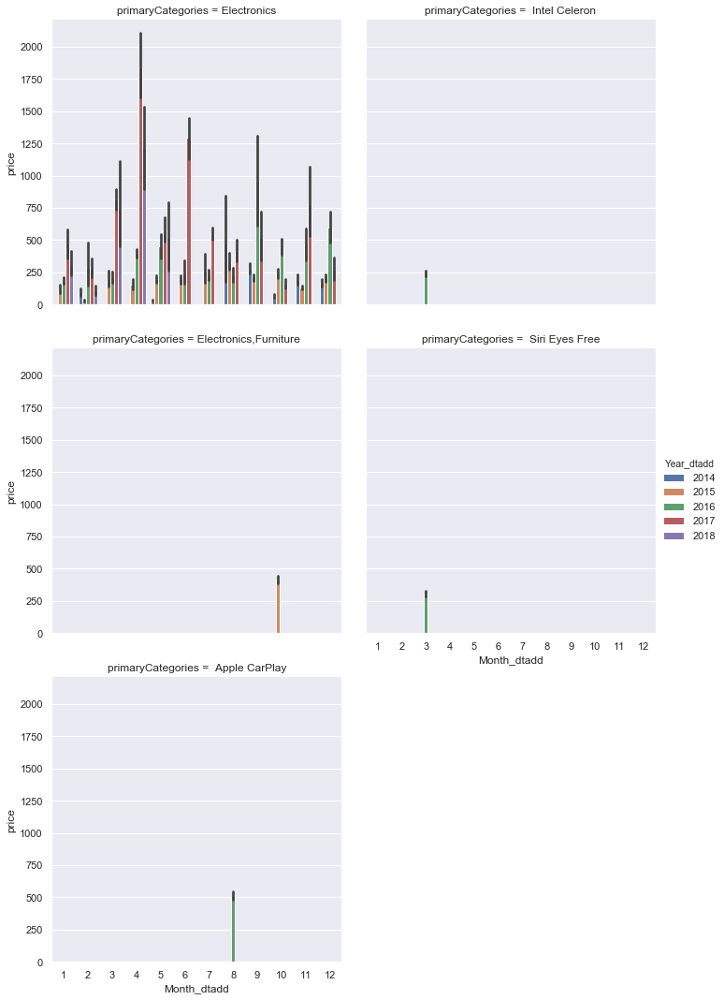

In [63]:
sns.set(style='darkgrid', font_scale=1.0) 
sns.catplot(x='Month_dtadd',
            y='price',hue='Year_dtadd',
            col='primaryCategories',
            col_wrap=2,
            data=dt_electronics,
            kind='bar')
plt.savefig('Dateadded_primaryCategories.png')

#### Observation
> From this graph we can conclude Electronis category has more price thatn other category <br/>
> I can also conclude that in 4th month of 2017 price is highest

> I will plot primaryCategories with dateUpdated

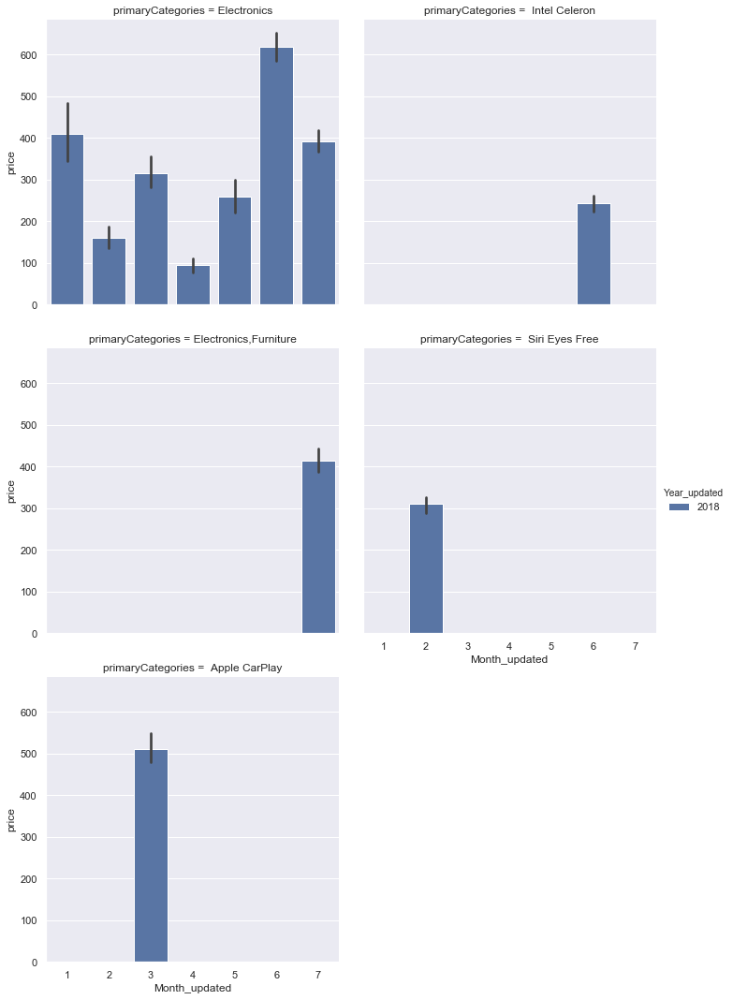

In [64]:
sns.set(style='darkgrid', font_scale=1.0) 
sns.catplot(x='Month_updated',
            y='price',hue='Year_updated',
            col='primaryCategories',
            col_wrap=2,
            data=dt_electronics,
            kind='bar')
plt.savefig('Dateupdated_primaryCategories.png')

#### Observation
> From this graph we can conclude Electronis category has more price thatn other category <br/>
> I can also conclude that in 6th month of 2018 price is highest

> I will plot manufacturer with dateAdded

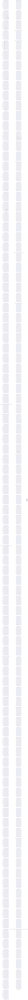

In [65]:

sns.set(style='darkgrid', font_scale=1.0) 
sns.catplot(x='Month_dtadd',
            y='price',hue='Year_dtadd',
            col='manufacturer',
            col_wrap=2,
            data=dt_electronics,
            kind='bar')
plt.savefig('Dateadded_manufacture.png')

#### Observation
> From this graph I can conclude Samsung has more price thatn other category <br/>
> I can also conclude that in 3rd month of 2017 price is highest

> I will plot brand with dateAdded

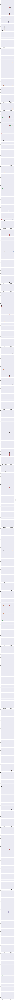

In [66]:
sns.set(style='darkgrid', font_scale=1.0) 
sns.catplot(x='Month_dtadd',
            y='price',hue='Year_dtadd',
            col='brand',
            col_wrap=2,
            data=dt_electronics,
            kind='bar')
plt.savefig('Dateadded_brand.png')

#### Observation
> From this graph I can conclude Sony has more price thatn other brand <br/>
> I can also conclude that in 4th month of 2017 price is highest

>  I will plot manufacturer with dateUpdated

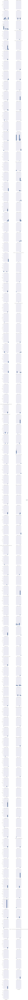

In [75]:
sns.set(style='darkgrid', font_scale=1.0) 
sns.catplot(x='Month_updated',
            y='price',hue='Year_updated',
            col='manufacturer',
            col_wrap=2,
            data=dt_electronics,
            kind='bar')
plt.savefig('Dateupdated_manufacturer.png')

#### Observation
> From this graph I can conclude Apple has more price thatn other category <br/>
> I can also conclude that in 1st and 5th month of 2018 price is highest

> I will plot band with dateupdated

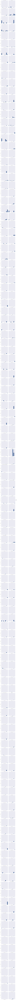

In [67]:
sns.set(style='darkgrid', font_scale=1.0) 
sns.catplot(x='Month_updated',
            y='price',hue='Year_updated',
            col='brand',
            col_wrap=2,
            data=dt_electronics,
            kind='bar')
plt.savefig('Dateupdated_brand.png')

#### Observation
> From this graph I can conclude SunBrite TV has more price thatn other brand <br/>
> I can also conclude that in 5th and 6th month of 2018 price is highest

> For primaryCategories  I will apply one-hot encodding

In [68]:
import plotly.express as px
import plotly.graph_objects as go

In [69]:
def histogram(data,path,color,title,xaxis,yaxis):
    fig = px.histogram(data, x=path,color=color)
    fig.update_layout(
        title_text=title,
        xaxis_title_text=xaxis, 
        yaxis_title_text=yaxis, 
        bargap=0.2, 
        bargroupgap=0.1
    )
    fig.show()

In [70]:
histogram(dt_electronics,"brand","brand",'Brand Count','Brand','Count')

In [71]:
Number_brand = dt_electronics['brand'].value_counts()
values = Number_brand.values
categories = pd.DataFrame(data=Number_brand.index, columns=["brand"])
categories['values'] = values

In [72]:
def treemap(categories,title,path,values):
    fig = px.treemap(categories, path=path, values=values, height=700,
                 title=title, color_discrete_sequence = px.colors.sequential.RdBu)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

In [73]:
treemap(categories,'Major Sales of Brand',['brand'],categories['values'])

In [74]:
def bar(categories,x,y,color,title,xlab,ylab):
    fig = px.bar(categories, x=x, y=y,
             color=color,
             height=400)
    fig.update_layout(
    title_text=title, 
    xaxis_title_text=xlab, 
    yaxis_title_text=ylab,
    bargap=0.2, 
    bargroupgap=0.1
    )
    fig.show()

In [75]:
bar(categories,categories['brand'][0:10],categories['values'][0:10]
    ,categories['brand'][0:10],'Top 10 brand','brand','Count')

In [76]:
Number_yeardtadded = dt_electronics['Year_dtadd'].value_counts()
years = pd.DataFrame(data=Number_yeardtadded.index, columns=["YEAR"])
years['values'] = Number_yeardtadded.values

In [77]:
fig = px.pie(years, values='values', names='YEAR', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [78]:
Price_month = dt_electronics['Month_dtadd'].value_counts()
months = pd.DataFrame(data=Price_month.index, columns=["MONTH"])
months['values'] = Price_month.values

In [79]:
fig = px.pie(months, values='values', names='MONTH', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [80]:
fig = go.Figure(go.Bar(
            x=months['values'],
            y=months['MONTH'],
        marker=dict(
            color='rgb(13,143,129)',

        ),
            orientation='h'))
fig.update_layout(
    title_text='Price count as per month', 
    xaxis_title_text='Count',
    yaxis_title_text='Month', 
    bargap=0.2, 
    bargroupgap=0.1
)
fig.show()

In [81]:
histogram(dt_electronics,"brand","brand",'Brand Count','Brand','Count')

In [82]:
histogram(dt_electronics,"brand","Year_dtadd",'Brand count per Category on each Year','Category','Crimes Count on each Year')

In [83]:
histogram(dt_electronics,"brand","Month_dtadd",'Brand count per Category on each Year','Category','Crimes Count on each Year')

In [84]:
histogram(dt_electronics,"Year_dtadd","Year_dtadd",'Price Count Yearly Basis','Year','Count')

In [85]:
high_brand = dt_electronics['brand'].value_counts()
brand = pd.DataFrame(data=high_brand.index, columns=["Brand"])
brand['values'] = high_brand.values

In [86]:
bar(brand,brand['Brand'][0:10],brand['values'][0:10]
    ,brand['Brand'][0:10],'Top 10 brands','brands',' Price Count')

In [87]:
dt_electronics.Year_dtadd.unique()

array([2015, 2017, 2014, 2016, 2018], dtype=int64)

In [88]:
dt_2014=dt_electronics[dt_electronics['Year_dtadd']==2014]

In [89]:
histogram(dt_2014,"brand","brand",'Brand count in 2014','Brand','Count')

In [90]:
histogram(dt_2014,"brand","Month_dtadd",'Brand count per month in 2014','Category','Brand')

> In Year 2014 Alpine band has the highest count 

In [91]:
dt_2015=dt_electronics[dt_electronics['Year_dtadd']==2015]

In [92]:
histogram(dt_2015,"brand","brand",'Brand count in 2015','Brand','Count')

In [93]:
histogram(dt_2015,"brand","Month_dtadd",'Brand count per month in 2015','Category','Brand')

> In Year 2015 Yamaha band has the highest count 

In [94]:
dt_2016=dt_electronics[dt_electronics['Year_dtadd']==2016]

In [95]:
histogram(dt_2016,"brand","brand",'Brand count in 2016','Brand','Count')

In [96]:
histogram(dt_2016,"brand","Month_dtadd",'Brand count per month in 2016','Category','Brand')

> In Year 2016 Sony band has the highest count 


In [97]:
dt_2017=dt_electronics[dt_electronics['Year_dtadd']==2017]

In [98]:
histogram(dt_2017,"brand","brand",'Brand count in 2017','Brand','Count')

In [99]:
histogram(dt_2017,"brand","Month_dtadd",'Brand count per month in 2017','Category','Brand')

> In Year 2017 Samsung band has the highest count 

In [100]:
dt_2018=dt_electronics[dt_electronics['Year_dtadd']==2018]

In [101]:
histogram(dt_2018,"brand","brand",'Brand count in 2018','Brand','Count')

In [102]:
histogram(dt_2018,"brand","Month_dtadd",'Brand count per month in 2018','Category','Brand')

> In Year 2018 Sony band has the highest count 

In [103]:
dt_electronics.columns

Index(['pricesavailability', 'pricescondition', 'pricesdateSeen',
       'pricesmerchant', 'pricesshipping', 'pricessourceURLs', 'asins',
       'brand', 'categories', 'ean', 'imageURLs', 'keys', 'manufacturer',
       'manufacturerNumber', 'name', 'primaryCategories', 'sourceURLs', 'upc',
       'weight', 'price', 'Currency_USD', 'pricesisSale_True',
       'brand_ordinal_labels', 'Month_dtadd', 'Year_dtadd', 'Month_updated',
       'Year_updated', 'manufacturer_count'],
      dtype='object')

In [104]:
primaryCategories=pd.get_dummies(dt_electronics.primaryCategories,drop_first=True,prefix='primaryCategories')
dt_electronics=pd.concat([dt_electronics,primaryCategories],axis=1)
dt_electronics.drop('primaryCategories',axis=1,inplace=True)
dt_electronics.head()

,pricesavailability,pricescondition,pricesdateSeen,pricesmerchant,pricesshipping,pricessourceURLs,asins,brand,categories,ean,imageURLs,keys,manufacturer,manufacturerNumber,name,sourceURLs,upc,weight,price,Currency_USD,pricesisSale_True,brand_ordinal_labels,Month_dtadd,Year_dtadd,Month_updated,Year_updated,manufacturer_count,primaryCategories_ Intel Celeron,primaryCategories_ Siri Eyes Free,primaryCategories_Electronics,"primaryCategories_Electronics,Furniture"
0,1590,4645,"2017-05-10T20:00:00Z,2017-05-09T15:00:00Z",2109,1,http://www.bestbuy.com/site/products/7100293.p...,B00I9HD8PK,Grace Digital,"Electronics,Home Audio & Theater,Home Audio,Al...",NaN,https://i5.walmartimages.com/asr/dd5f42c4-076c...,"819127010485,ecoxgearecostonebluetoothspeaker/...",Ecoxgear,GDI-EGST701,EcoXGear Ecostone Bluetooth Speaker,http://www.walmart.com/ip/EcoXGear-Ecostone-Bl...,8.19E+11,3 pounds,92.99,1,0,93,11,2015,2,2018,11.0,0,0,1,0
1,1590,4645,"2017-10-10T02:00:00Z,2017-08-12T03:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/lenovo-100s-14ibr...,B06ZY63J8H,Lenovo,"Electronics,Computers,Laptops,Laptops By Brand...",NaN,https://i5.walmartimages.com/asr/fcc50cce-a3c1...,"190793918948,lenovo100s14ibr14laptopintelceler...",NaN,100s-14ibr,Lenovo - 100S-14IBR 14 Laptop - Intel Celeron ...,https://www.walmart.com/ip/Lenovo-100S-14IBR-1...,1.91E+11,4.3 pounds,229.99,1,0,184,3,2017,1,2018,NaN,0,0,1,0
2,1590,4645,"2017-10-10T19:00:00Z,2017-09-12T14:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/house-of-marley-s...,B00G3P9UMU,House of Marley,"Headphones,Consumer Electronics,Portable Audio...",8.47E+11,https://i5.walmartimages.com/asr/c124aa15-b9e3...,"0846885007037,houseofmarleysmilejamaicainearea...",House Of Marley,EM-JE041-MI,House of Marley Smile Jamaica In-Ear Earbuds,https://www.walmart.com/ip/House-of-Marley-Smi...,8.47E+11,0.6 ounces,16.99,1,0,107,10,2014,5,2018,10.0,0,0,1,0
3,1590,4645,"2017-09-08T05:00:00Z,2017-09-18T13:00:00Z,2017...",2109,1,https://www.bestbuy.com/site/products/6311012....,B00TTWZFFA,Sony,"Electronics,Home Audio & Theater,Home Audio,Al...",NaN,https://i5.walmartimages.com/asr/1be435f7-5f3a...,"sonyultraportablebluetoothspeaker/sosrsx11bk,s...",Sony,SRSX11/BLK,Sony Ultra-Portable Bluetooth Speaker,https://www.walmart.com/ip/Sony-Ultra-Portable...,27242886599,1 pounds,69.99,1,0,241,11,2015,1,2018,179.0,0,0,1,0
4,63,4645,2017-12-05T13:00:00Z,1119,0,https://www.bhphotovideo.com/c/product/1105014...,B00MHPAF38,Sony,"Digital Cameras,Cameras & Photo,Used:Digital P...",NaN,http://i.ebayimg.com/thumbs/images/g/TBUAAOSwd...,sonyalphaa5100digitalcamerakitwith1650mmlenswh...,NaN,ILCE5100L/W,Alpha a5100 Mirrorless Digital Camera with 16-...,https://reviews.bestbuy.com/3545/8429343/revie...,27242883246,9.98 oz 4.09 oz,846.00,1,1,241,7,2017,7,2018,NaN,0,0,1,0


In [105]:
dt_electronics.columns

Index(['pricesavailability', 'pricescondition', 'pricesdateSeen',
       'pricesmerchant', 'pricesshipping', 'pricessourceURLs', 'asins',
       'brand', 'categories', 'ean', 'imageURLs', 'keys', 'manufacturer',
       'manufacturerNumber', 'name', 'sourceURLs', 'upc', 'weight', 'price',
       'Currency_USD', 'pricesisSale_True', 'brand_ordinal_labels',
       'Month_dtadd', 'Year_dtadd', 'Month_updated', 'Year_updated',
       'manufacturer_count', 'primaryCategories_ Intel Celeron',
       'primaryCategories_ Siri Eyes Free', 'primaryCategories_Electronics',
       'primaryCategories_Electronics,Furniture'],
      dtype='object')

> I will drop these columns 'categories','brand','ean', 'imageURLs', 'keys', 'manufacturer','manufacturerNumber', 'name', 'sourceURLs', 'upc', 'weight' <br/>
> categories data is reflected with primaryCategories so categories can be dropped <br/>
> manufacturer column is replaced with manufacturer_count <br/>
> brand column is replaced with brand_ordinal_labels <br/>
> These columns  'imageURLs', 'keys', 'name', 'sourceURLs', 'upc', 'weight'
       

In [106]:
dt_electronics.drop(['categories','brand','ean', 'imageURLs', 'keys', 'manufacturer','manufacturerNumber', 'name', 'sourceURLs', 'upc', 'weight'],axis=1,inplace=True)

In [107]:

dt_electronics.drop(['manufacturer_count'],axis=1,inplace=True)

# Feature Selection
## I will apply different techniques 

### 1. Corelation

In [108]:
dt_electronics.corr()

,pricesavailability,pricescondition,pricesmerchant,pricesshipping,price,Currency_USD,pricesisSale_True,brand_ordinal_labels,Month_dtadd,Year_dtadd,Month_updated,Year_updated,primaryCategories_ Intel Celeron,primaryCategories_ Siri Eyes Free,primaryCategories_Electronics,"primaryCategories_Electronics,Furniture"
pricesavailability,1.000000,0.508854,-0.199715,-0.065426,0.001523,0.017189,0.165858,-0.043529,0.061236,-0.048377,-0.061485,NaN,-0.003307,0.016289,0.021845,-0.020494
pricescondition,0.508854,1.000000,-0.156314,-0.054341,0.044039,0.035772,0.057858,-0.038755,0.061123,-0.077155,-0.113257,NaN,0.016780,0.012502,-0.019811,-0.010420
pricesmerchant,-0.199715,-0.156314,1.000000,-0.046848,-0.101360,0.016838,0.036040,-0.018151,0.030877,-0.060192,-0.006993,NaN,0.002815,-0.008711,0.001039,0.029441
pricesshipping,-0.065426,-0.054341,-0.046848,1.000000,0.006110,-0.038293,-0.024236,0.019603,-0.019298,0.018375,-0.011559,NaN,-0.000720,0.000023,0.003680,-0.000767
price,0.001523,0.044039,-0.101360,0.006110,1.000000,0.007988,0.196968,0.459283,-0.176262,0.303137,0.066859,NaN,-0.013246,-0.007232,0.009082,-0.003988
Currency_USD,0.017189,0.035772,0.016838,-0.038293,0.007988,1.000000,0.007708,0.001164,-0.009069,0.015117,-0.003298,NaN,0.000552,0.000412,-0.001225,0.000521
pricesisSale_True,0.165858,0.057858,0.036040,-0.024236,0.196968,0.007708,1.000000,0.171290,-0.036799,0.108899,0.023486,NaN,0.029525,-0.017243,-0.010797,0.011698
brand_ordinal_labels,-0.043529,-0.038755,-0.018151,0.019603,0.459283,0.001164,0.171290,1.000000,-0.106666,0.284173,0.148022,NaN,0.034049,0.004390,-0.019339,0.011637
Month_dtadd,0.061236,0.061123,0.030877,-0.019298,-0.176262,-0.009069,-0.036799,-0.106666,1.000000,-0.540592,-0.051370,NaN,-0.051222,-0.038165,0.004201,0.037994
Year_dtadd,-0.048377,-0.077155,-0.060192,0.018375,0.303137,0.015117,0.108899,0.284173,-0.540592,1.000000,0.160551,NaN,-0.005237,-0.003902,0.027809,-0.042786


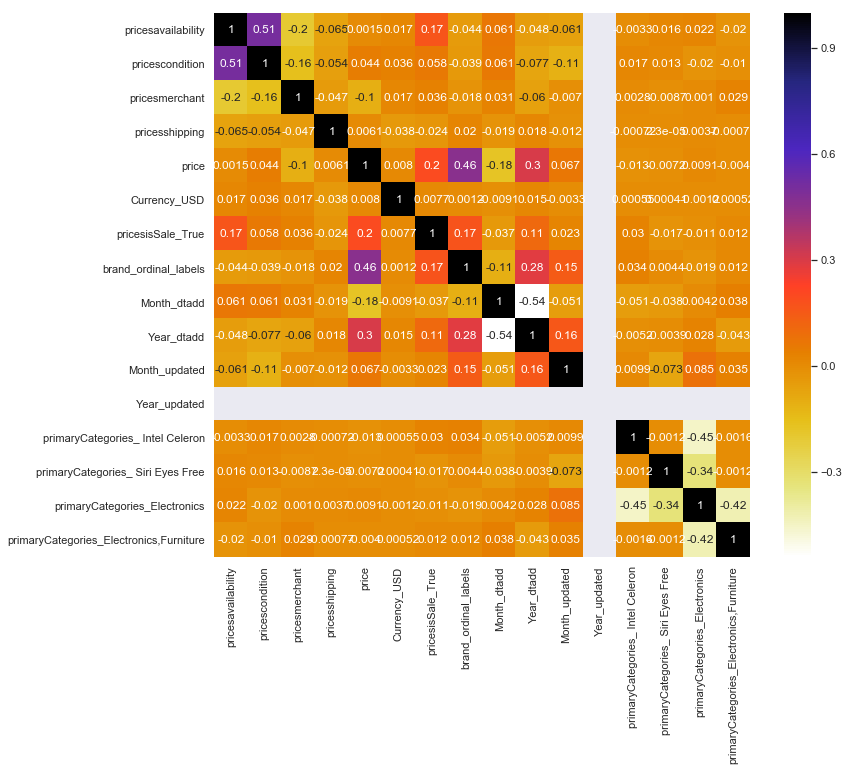

In [109]:
plt.figure(figsize=(12,10))
cor = dt_electronics.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [110]:
def correlation_feature(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

> Settting the threshold value to 0.5

In [111]:
corr_features = correlation_feature(dt_electronics, 0.5)
len(set(corr_features))

2

In [112]:
corr_features

{'Year_dtadd', 'pricescondition'}

### 2. Finding zero variance columns

In [113]:
zero_var=dt_electronics.var()[dt_electronics.var()==0].index.values

In [114]:
zero_var

array(['Year_updated'], dtype=object)

#### Observation 
>From the above Feature Selection process I can conclude that I can drop these three colums 'Year_dtadd',  'pricescondition',    'Year_updated' <br/>


In [115]:
dt_electronics.columns

Index(['pricesavailability', 'pricescondition', 'pricesdateSeen',
       'pricesmerchant', 'pricesshipping', 'pricessourceURLs', 'asins',
       'price', 'Currency_USD', 'pricesisSale_True', 'brand_ordinal_labels',
       'Month_dtadd', 'Year_dtadd', 'Month_updated', 'Year_updated',
       'primaryCategories_ Intel Celeron', 'primaryCategories_ Siri Eyes Free',
       'primaryCategories_Electronics',
       'primaryCategories_Electronics,Furniture'],
      dtype='object')

In [116]:
dt_electronics.drop('pricesdateSeen',axis=1,inplace=True)

In [117]:
dt_electronics.drop(['pricessourceURLs','asins'],axis=1,inplace=True)

In [118]:
dt_electronics.drop(['Year_dtadd','pricescondition','Year_updated'],axis=1,inplace=True)

## Model Development

In this section I will use differnt machine learning algorithm to predict the sales for these stores

### Performance Metric

>I am going to use R square value as performance metric. The intution behind R square value is when R square is closer to 1 indicates that it's a better model <br/>

In [119]:
x=dt_electronics.drop('price',axis=1)
y=dt_electronics['price']

> Splitting the dataset into train and test dataset

In [120]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=42)

In [121]:
x_train.shape,y_train.shape

((3805, 12), (3805,))

### Linear Regression

In [122]:
model_lr=LinearRegression()
model_lr.fit(x_train,y_train)
model_pred_tr=model_lr.predict(x_train)
model_pred_test=model_lr.predict(x_test)

In [123]:
print('R2 square for train',r2_score(y_train,model_pred_tr))
print('R2 square for test',r2_score(y_test,model_pred_test))

R2 square for train 0.25029309674174804
R2 square for test 0.25411079403472836


#### Observation
> As I know if R square vale is close to 1 it indicate that it's a good model <br/>
> From the above R square value for train and test I can see that both are not close to 1 <br/>
> For both train and test set my model is giving same value for R Square which indicate that model is not over fit

Text(0, 0.5, 'Predicted Price ')

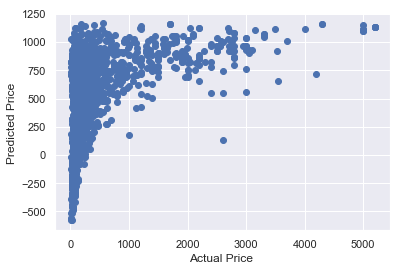

In [124]:
plt.scatter(y_test,model_pred_test)
plt.xlabel('Actual Price ')
plt.ylabel('Predicted Price ')

### Random Forest

In [125]:
model_rand=RandomForestRegressor()
model_rand.fit(x_train,y_train)
model_rand_train=model_rand.predict(x_train)
model_rand_test=model_rand.predict(x_test)

C:\Users\Subhasish Das\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



In [126]:
print('R2 square for train',r2_score(y_train,model_rand_train))
print('R2 square for test',r2_score(y_test,model_rand_test))

R2 square for train 0.8590821598025388
R2 square for test 0.6690774022260699


#### Observation
> From Random forest model I am getting R2 square value more closer to 1 which indicate that this model is better than Linear Regression model  <br/>

Text(0, 0.5, 'Predicted Price ')

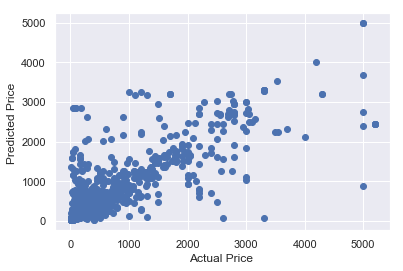

In [127]:
plt.scatter(y_test,model_rand_test)
plt.xlabel('Actual Price ')
plt.ylabel('Predicted Price ')

### Decision Tree

In [128]:
dct_mod=DecisionTreeRegressor()
dct_mod.fit(x_train,y_train)
dct_mod_train=dct_mod.predict(x_train)
dct_mod_test=dct_mod.predict(x_test)

In [129]:
print('R2 square for train',r2_score(y_train,dct_mod_train))
print('R2 square for test',r2_score(y_test,dct_mod_test))

R2 square for train 0.887933143003788
R2 square for test 0.5775396171730032


#### Observation
> From Decision Tree Regressor model I am getting R2 square value .92 which is less than the value I got from Random Forest  <br/>

Text(0, 0.5, 'Predicted price ')

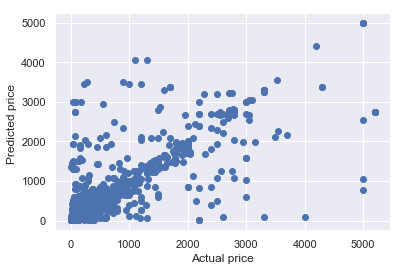

In [130]:
plt.scatter(y_test,dct_mod_test)
plt.xlabel('Actual price')
plt.ylabel('Predicted price ')

#### Conclusion
> This Problem is not about Prediction. This problem is about the the price distribution of brands and categories on a yearly basis <br/>
> That distribution is showed on above graph that which band which manufacturer and which category has highest price over a period of 3 years